 **Mount google drive**

In [3]:
from google.colab import drive
from google.colab import files

#mount google drive to import file
drive.mount('/content/drive')

#uploaded = files.upload()




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Import Libraries**

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)3153920/45929032 bytes (6.9%)6840320/45929032 bytes (14.9%)10502144/45929032 bytes (22.9%)14049280/45929032 bytes (30.6%)17768448/45929032 bytes (38.7%)21176320/45929032 bytes (46.1%)24870912/45929032 bytes (54.2%)28532736/45929032 bytes (62.1%)32186368/45929032 bytes (70.1%)35864576/45929032 bytes (78.1%)39411712/45929032 bytes (85.8%)42967040/45929032 bytes (93.6%)

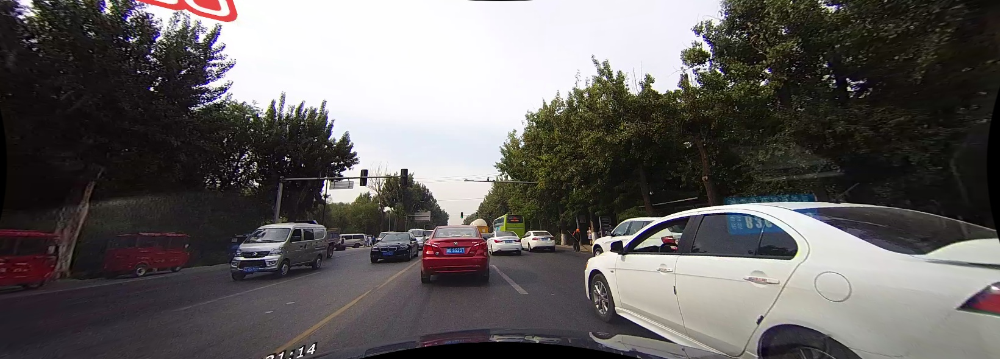

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import random
import sys
from google.colab.patches import cv2_imshow
import pandas as pd

from moviepy.editor import VideoFileClip
from tensorflow import keras
import pandas as pd




#read the image from the CULane file from the google drive
Image1 = cv2.imread('/content/drive/MyDrive/culane/driver_161_90frame/03240.jpg')
#Cordinates1 = pd.read_csv('/content/drive/MyDrive/Lane Detection Data/00000.lines.txt')

cv2_imshow(Image1)


**Canny the image**

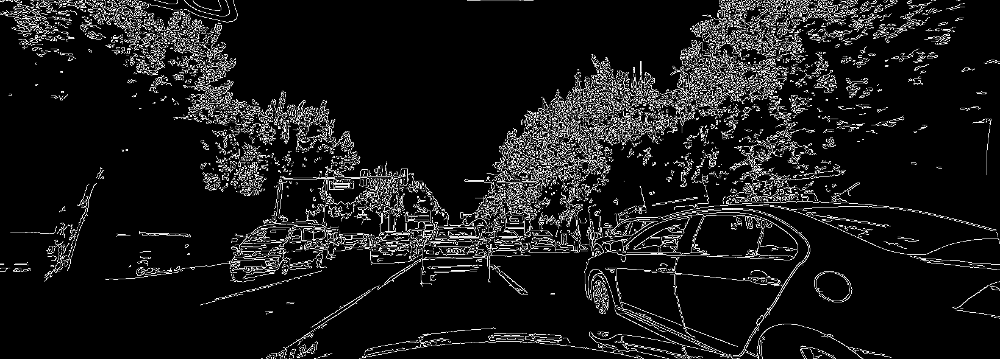

In [5]:
def canny(image):
  #turn the image gray and try to reduce the noise
  gray_image = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
  #blur_image = cv2.GaussianBlur(gray_image,(5,5),0)    This part is removed, since it will also blur out the right lane due to the color difference

  #reduce the noice of the image, find intensity gradient of the image
  #https://java2blog.com/cv2-canny-python/
  canny = cv2.Canny(gray_image,50,200)
  #cv2_imshow(gray_image)
  return canny

cv2_imshow(canny(Image1))

**Define the region of interest**


In [6]:
#region of interest
def roi(image):
  #Since the y-coordinates increases going downwards
  #we want to use image.shape to find the bottom coordinate of the image
  bot_coordinate = image.shape[0]
  #find the interest region in the image
  #draw the interest area on the image to find the lane
  #the coordinates (1100,520) represents the bottom right of the triangle
  #the coordinates (750,300) represents the bottom left of the triangle
  #the coordinates (400,bot_coordinate) represents the top part of the triangle
  triangle_interest = np.array([
      [(400,bot_coordinate),(1100,520),(750,300)]
      ])
  #find the blank matrix, so that mask fits and have the same height and width as image
  mask = np.zeros_like(image)

  #fill the open mask with the triangle, and since we want it to be filled with white, the value is set to 255
  cv2.fillPoly(mask,triangle_interest,255)

  #Computes the image and mask, changing the canny image to only show the region of interest traced by the polygonal contour
  masked_image = cv2.bitwise_and(image,mask)
  
  return masked_image

**Show the output**

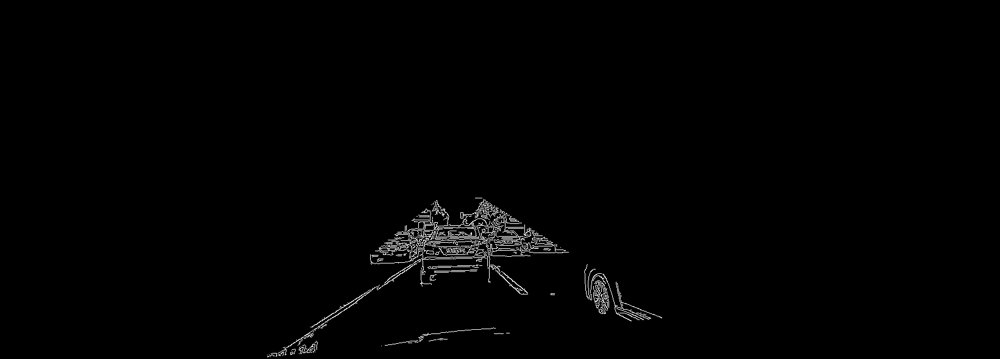

In [7]:
#copy the image and it into lane image, since we still want to use to original file
lane_image = np.copy(Image1)
#use the canny function and save it
canny_image = canny(lane_image)
#use the region of interest function to only show the lanes in the triangle area
cropped_image = roi(canny_image)
#show to the image
cv2_imshow(cropped_image)

**The original image on a graph**

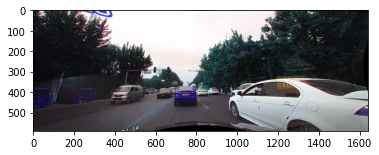

In [8]:
#show the image
plt.imshow(lane_image)

**Canny image on a graph**

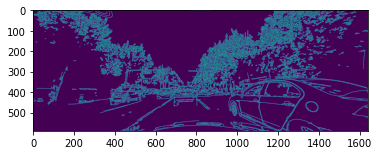

In [9]:
#show the canny image
plt.imshow(canny_image)

**Put the region of interest on the gr**aph

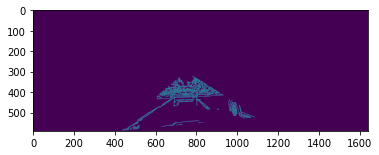

In [10]:
#show the image in the region of interest
plt.imshow(roi(canny_image))

**Use Hough Transformation to show the lines**

In [11]:
def display_lines(image, lines):
  #declare an array with zeros
  line_image = np.zeros_like(image)
  #show the lines on the picture that can be identified
  #check if the array if empty
  if lines is not None:
    #if the array is not empty
    for line in lines:
      #print(line)
      #each line is a 2D array with 2 elements, and we want to shape all the array into a 1D array with 4 elements
      x1,y1,x2,y2 = line.reshape(4)
      cv2.line(line_image,(x1,y1),(x2,y2),(255,255,0),5)
  return line_image
#houghlines function to determine what are the lines that intersects the most
#https://docs.opencv.org/3.4/d3/de6/tutorial_js_houghlines.html
lines = cv2.HoughLinesP(
    cropped_image,
    #the distance resolution of the accumulator in pixels, too small or too big can both create inaccurate lines
    rho=2,
    #angle resolution of the accumulator in radians.
    theta=np.pi/180, 
    #miminum number of intersection to detect the line
    threshold=50,
    #empty array
    lines=np.array([]),
    #minimum length of the line in pixels to display it
    minLineLength=40,
    #max distance in pixels between segmented line and connect them to become a single line
    maxLineGap=5)
line_image = display_lines(lane_image, lines)


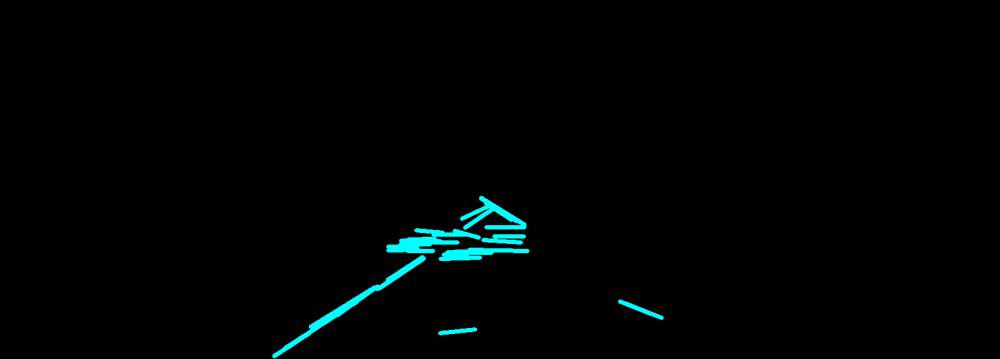

In [12]:
cv2_imshow(line_image)

**Put the lines on the original image**

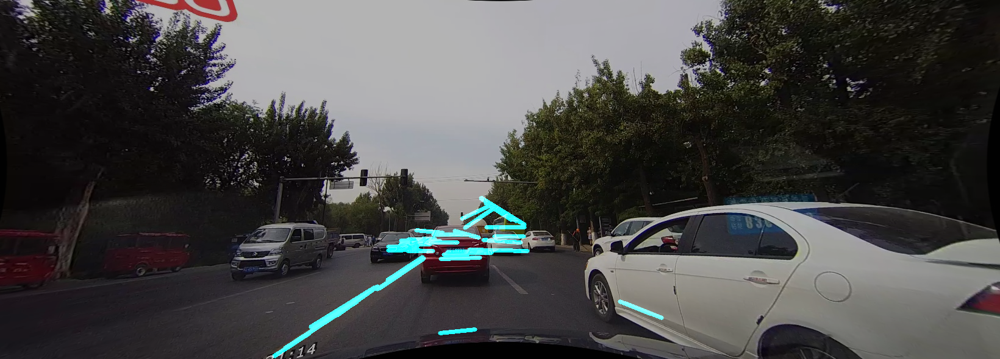

In [13]:
#put the line image on the original image
#decrease the element from lane_image by 0.7 and add line_image with 1, better showing line_image
combine_image = cv2.addWeighted(lane_image,0.7,line_image,1,1)
cv2_imshow(combine_image)

**Combine all the lines into one line on each side**

In [24]:
#define where to put the lines, the starting point of the lines
def coordinates(image,line_values):
  #we want the line to start at the bottom of the image
  slope,intercept = line_values
  #height of the image, the coordinate of the lowest part of the image
  y1 = image.shape[0]
  #puting the end of the line at 4/5 height of the image
  y2 = int(y1*(4/5))
  x1 = int((y1 - intercept)/slope)
  x2 = int((y2 - intercept)/slope)
  #Since the coordinates of the middle of the car does not change, if x1<750 it is the left lane, other wise it is the right lane
  if x1<750:
    print("The car is ", 750-x1," pixels away from the left")
  else:
    print("The car is ", x1-750," pixels away from the right")
  #print(abs(750-x1))
 
  return np.array([x1,y1,x2,y2])

#finding where the  slopes and lines intercept, average slope interception
def asi(image,lines):
  #empty array for both the left and right fit, these arrays will contain the coordinates of the lines for each side
  left_array = []
  right_array = []
  #loop through every line determined by the Hough Transform
  for line in lines:
    #reshape the lines to an 1D array with 4 elements
    #similar to what we did for the display_lines function
    x1,y1,x2,y2 = line.reshape(4)

    #fit a first degree polynomial to our x and y point that describes the slope and its coordinates
    #https://numpy.org/doc/stable/reference/generated/numpy.polyfit.html
    parameters = np.polyfit((x1,x2),(y1,y2),1)

    #slope is the first element in the array and the x intercept is the second elemnt
    #put the slope value to the first index
    slope = parameters[0]
    #put the intercept value to the second index
    intercept = parameters[1]
    
    #determine if the line is on the left side or the right side
    #on a graphic of functions, the left line should have a negative slope, while the right line a positive slope
    if slope<0:
      #if the slope is negative, append the line to the left array
      left_array.append((slope,intercept))
    else:
      #if the slope is positive, append the line to the right array
      right_array.append((slope,intercept))
  
  #averaging and the left and right arrays, to generate one single line on each side
  left_array_avg = np.average(left_array,axis=0)
  right_array_avg = np.average(right_array,axis=0)

  #print(left_array_avg)
  #print(right_array_avg)


  #put the determined lines to the coresponding coordinates
  left_line = coordinates(image,left_array_avg)
  right_line = coordinates(image,right_array_avg)
  
  return np.array([left_line,right_line])

The car is  537  pixels away from the left
The car is  1128  pixels away from the right


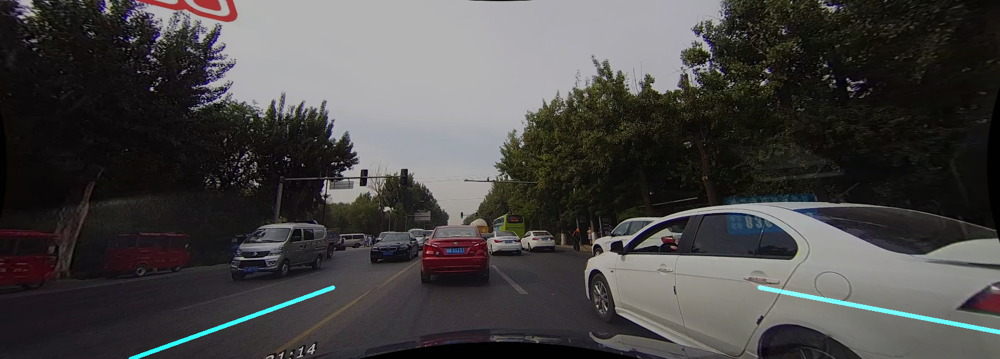

In [25]:
#use the asi function and find the fitted line
fit_line = asi(lane_image,lines)
#put the fitted line to the display line function, and draw it on a black image
line_image = display_lines(lane_image,fit_line)
#put the lines drawn on the black image and combine it with the original image
final_image = cv2.addWeighted(lane_image,0.7,line_image,1,1)
cv2_imshow(final_image)

**Video input to detect lanes**

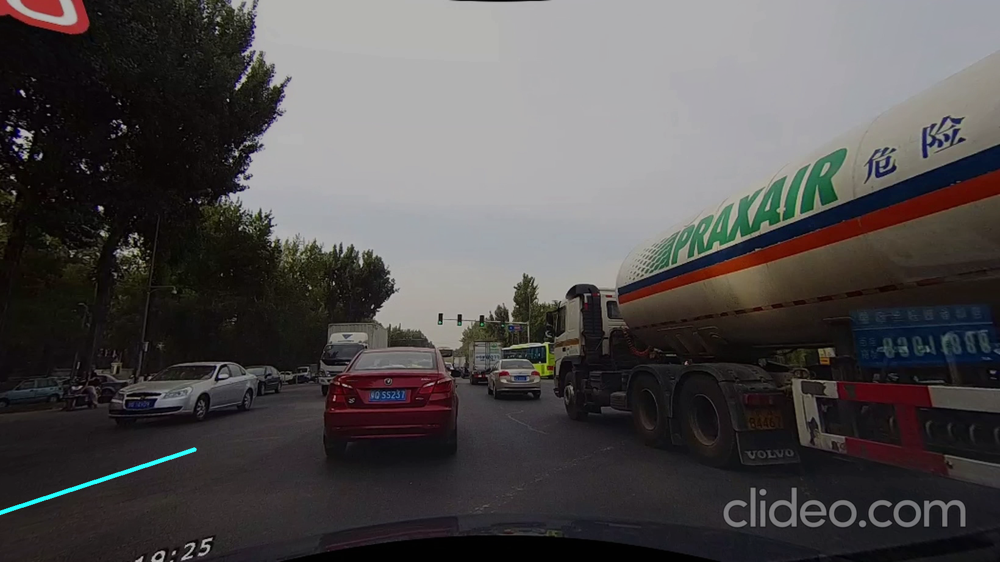

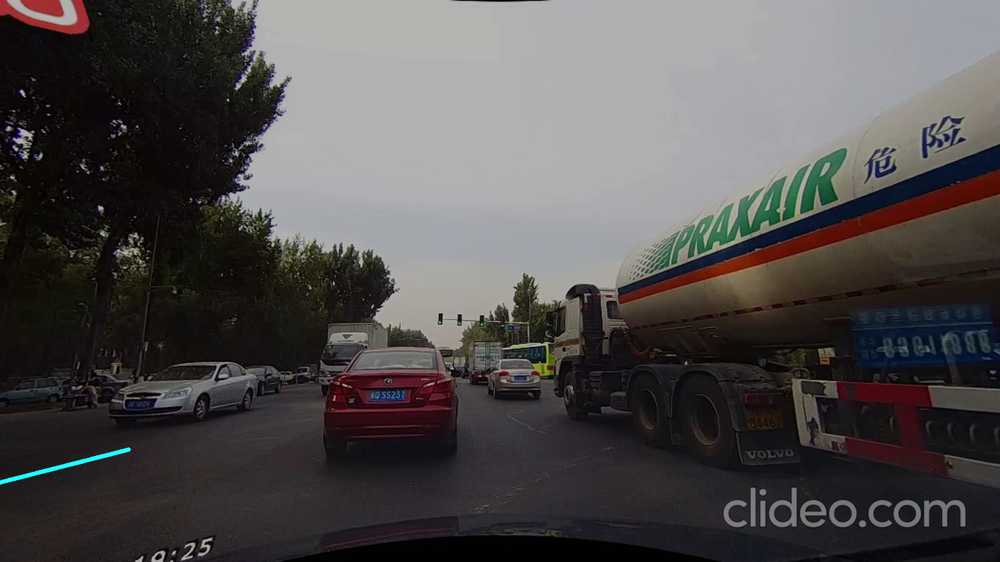

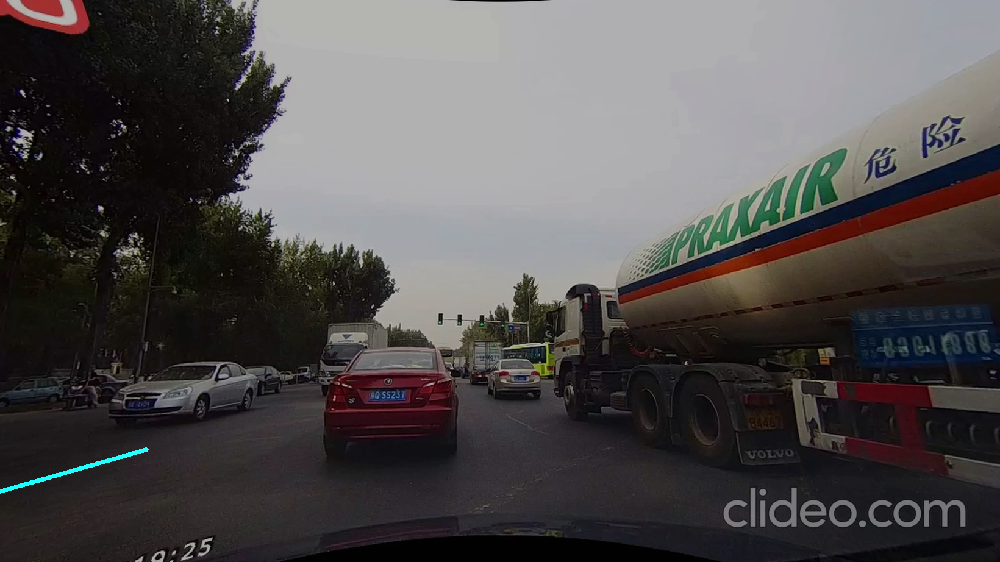

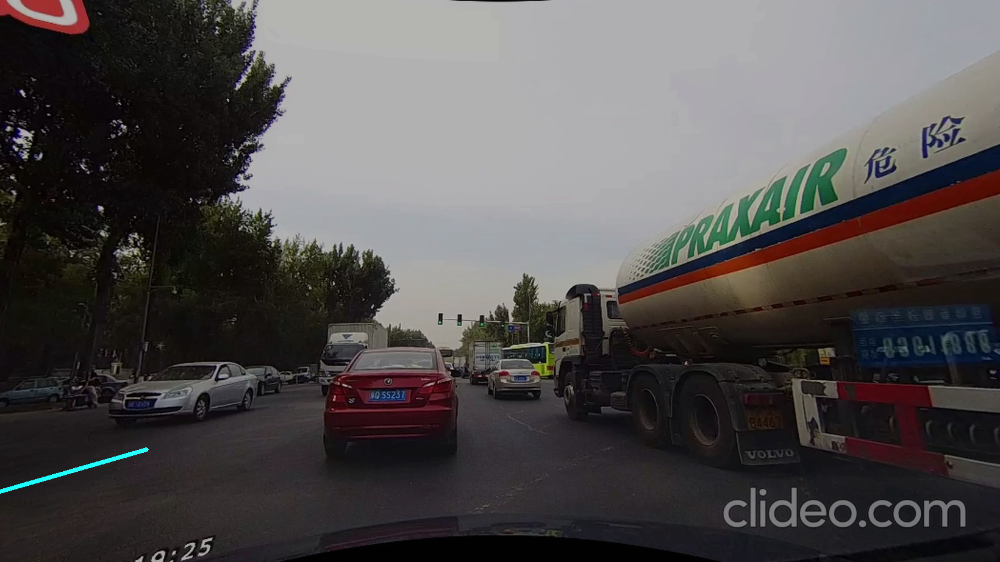

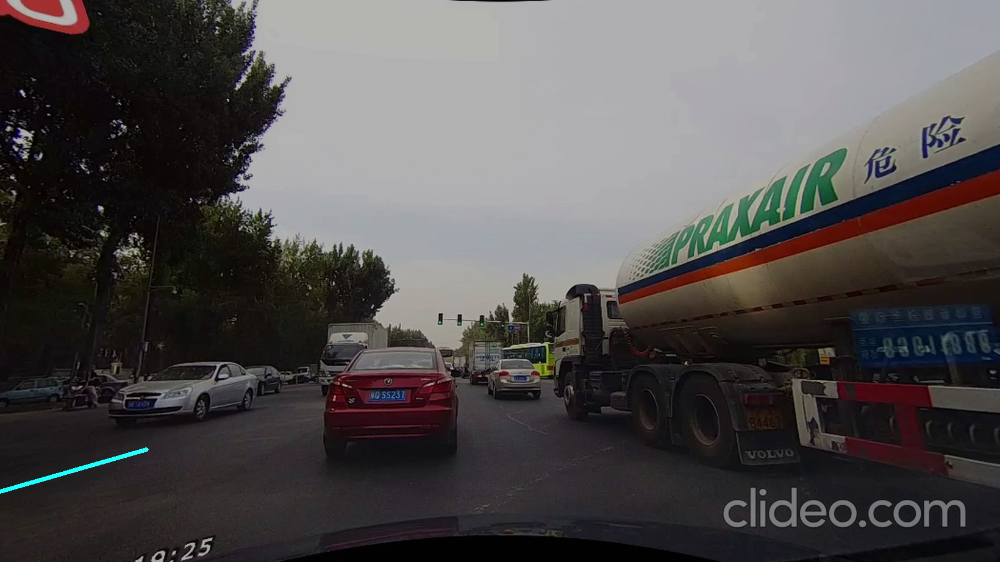

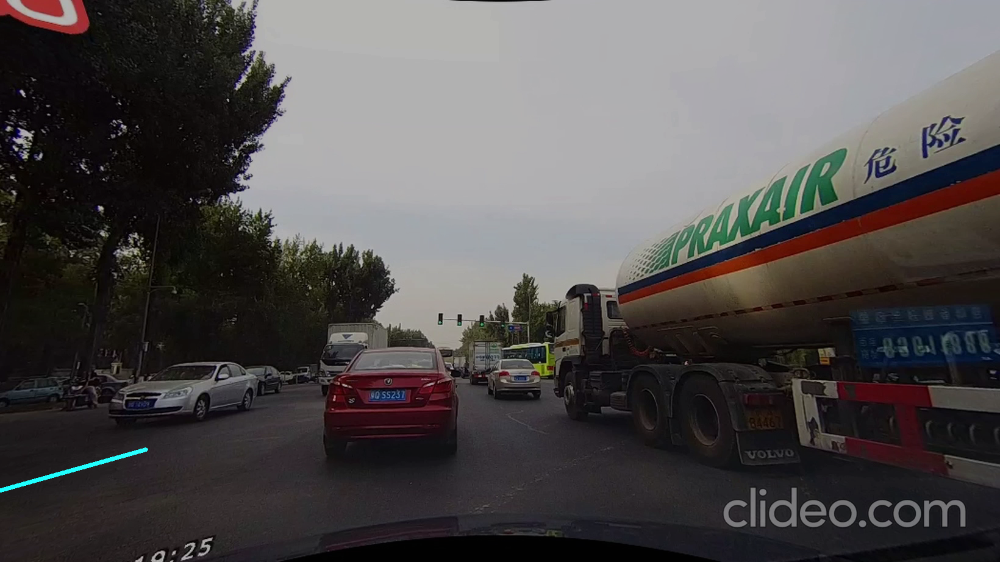

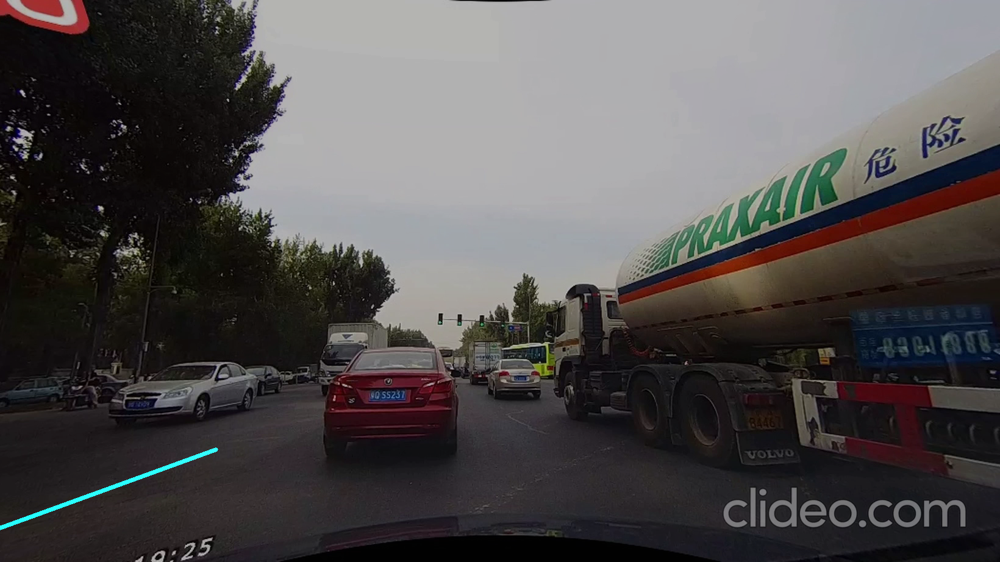

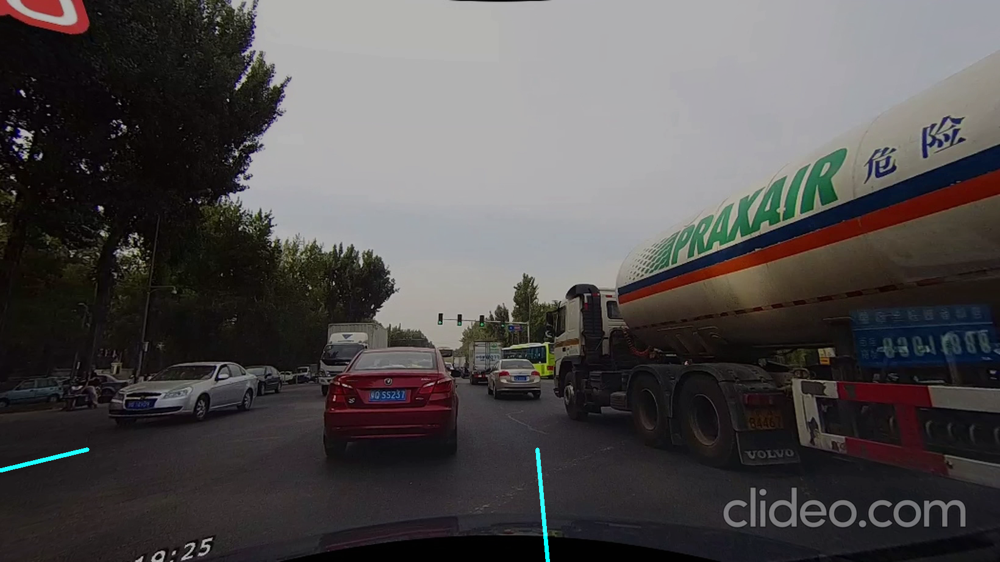

In [ ]:
#i've put the data image online and created an mp4 version of all the pictures and saved it on google drive
lane_video = cv2.VideoCapture("/content/drive/MyDrive/culane/LanePicutreVideo.mp4")
#open the lane video and apply all the function above to determine the lane
while(lane_video.isOpened()):
  #read all the pictures in the video
  _, frame = lane_video.read()
  
  #apply everything above
  canny_image = canny(frame)
  cropped_image = roi(canny_image)

  lines = cv2.HoughLinesP(
    cropped_image,
    rho=1,
    theta=np.pi/180, 
    threshold=50,
    lines=np.array([]),
    minLineLength=40,
    maxLineGap=5)


  average_line = asi(frame,lines)
  line_image = display_lines(frame,average_line)
  final_image = cv2.addWeighted(frame,0.7,line_image,1,1)
  cv2_imshow(final_image)



